#Training code presentation(without fine-tuning)
Please replace file paths for your environment.

Assumed environment:Colab or Kaggle Notebook with **TPU**

For memory and training optimization, numpy arrays are not used since it only use CPU and system memory.(If you want to use numpy, use JAX instead)

TFRecords can be also utilized but I didn't, and used numpy arrays as initial input because of its easiness.If you want to train them with large dataset which cannot be loaded on memory, I recommend to use TFRecords and streaming feature, or implement queue structure.(Be aware:tensor object(CPU-TPU data transfer) itself is limited to 2GB. So if you'll use 4GB dataset, separate it into 2 sets and send it to TPU individually, then concat them on TPU before using)


In [ ]:
#!pip install tensorflow==2.12.1 #use version if you encounter AttributeErrors in ONNX

In [ ]:
import os, tarfile
from google.colab import drive
drive.mount('/content/drive')
if not os.path.exists('./datasets'):
  os.mkdir('./datasets')
data_size = 960
source_path1 = f"/content/drive/MyDrive/Colab Notebooks/HD_FHD_datasets/Validation{data_size}.npy"
source_path2 = f"/content/drive/MyDrive/Colab Notebooks/HD_FHD_datasets/Training{data_size}.npy"
!cp '{source_path1}'  "./datasets"
!cp '{source_path2}'  "./datasets"

Mounted at /content/drive


In [ ]:
import tensorflow as tf
print(tf.__version__)
import numpy as np
import cv2,os,math,keras
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input,Conv2D,MaxPool2D,AveragePooling2D,Conv2DTranspose,Concatenate,Activation,BatchNormalization,Flatten,Dense,Reshape,Dropout,Layer,Add,Lambda
import tensorflow.keras.backend as K
from tensorflow.keras.callbacks import Callback, History,ModelCheckpoint,LearningRateScheduler
from tensorflow.keras.models import Model

2.12.0


In [ ]:
#Please refer tensorflow documentaion, because TPU will not be experimental
resolver = tf.distribute.cluster_resolver.TPUClusterResolver()#acquire TPU info
tf.config.experimental_connect_to_cluster(resolver)#connect
tf.tpu.experimental.initialize_tpu_system(resolver)#initialize, or re-init for memory release(not in Kaggle)
strategy = tf.distribute.TPUStrategy(resolver)#set distribution strategy
from tensorflow.keras import mixed_precision
policy = mixed_precision.Policy('mixed_bfloat16')
mixed_precision.set_global_policy(policy)
print("bfloat16 will be utilized")

bfloat16 will be utilized


bfloat16
(200, 640, 640)


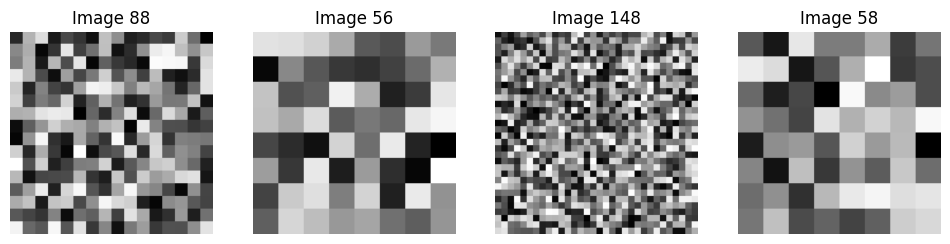

In [ ]:
output_size = 640,640
create=1
if create:
    # Function to generate a random grayscale image of a given size with values in [0, 1]
    def generate_random_image_float(size):
        return np.random.rand(size, size)
    # Function to resize an image to a specified size
    def resize_image(image, target_size):
        return cv2.resize(image, target_size, interpolation=cv2.INTER_NEAREST)
    # Generate and resize images for each size
    image_sizes = [4, 8, 16, 32, 64]
    num_images =40
    resized_images = np.empty((len(image_sizes) * (num_images), output_size[0],output_size[1]), dtype='bfloat16')

    index = 0
    for size in image_sizes:
        for _ in range(num_images):
            original_image = generate_random_image_float(size)
            resized_image = resize_image(original_image, (output_size[1],output_size[0]))
            resized_images[index] = resized_image
            index += 1
        #num_images -=1  #if you decrease in this way, apply num_images-2 in array prep
    #np.random.shuffle(resized_images) #it causes some memory issues????
    np.save(f"LFMN_images{output_size[0]}",resized_images)
    #resized_images = np.tile(resized_images, (100, 1, 1))
    print(resized_images.dtype)
    print(resized_images.shape)
    plt.figure(figsize=(12, 8))
    random_indices = np.random.choice(range(resized_images.shape[0]), size=4, replace=False)
    for i, idx in enumerate(random_indices, 1):
        plt.subplot(1, 4, i)
        plt.imshow(tf.cast(resized_images[idx],dtype='float32'), cmap='gray')
        plt.title(f'Image {idx + 1}')
        plt.axis('off')
    plt.show()

def imresize(array,shape):
    resized_images = np.empty((array.shape[0], shape[0], shape[1]), dtype=array.dtype)
    for i in range(array.shape[0]):
        # Extract the current image
        current_image = array[i, :, :]  # Assuming the channel axis is the last one
        # Resize the image using cv2.resize
        resized_image = cv2.resize(current_image, (shape[1],shape[0]), interpolation=cv2.INTER_LINEAR)
        # Add the resized image to the new array
        resized_images[i, :, :] = resized_image

    return resized_images

In [ ]:
x_train = np.load(f'./datasets/Training{data_size}.npy')
x_test = np.load(f'./datasets/Validation{data_size}.npy')
resize=1
if resize:
    shape=output_size
    x_train=imresize(x_train,shape)
    x_test=imresize(x_test,shape)
x_test=tf.image.convert_image_dtype(x_test,dtype='bfloat16')

merge=1#combine DIV2K and LFMN
if merge:
    x_train=tf.image.convert_image_dtype(x_train,dtype='bfloat16')
    x_train = tf.concat((x_train, tf.cast(resized_images,dtype='bfloat16')), axis=0)
else:#use only LFMN
    x_train=tf.image.convert_image_dtype(resized_images,dtype='bfloat16')

x_train = tf.expand_dims(x_train, axis=-1)#make them NHWC
x_test = tf.expand_dims(x_test, axis=-1)
#confirm they are idential except axis 0
print(x_train.shape)
print(x_test.shape)
print(x_train.dtype)
print(x_test.dtype)

(1000, 640, 640, 1)
(100, 640, 640, 1)
<dtype: 'bfloat16'>
<dtype: 'bfloat16'>


For different condition, you have to change variables in next cell such as pixel size, propagation distances

In [ ]:
def PropagationLayer(input,mode=None):#Angular spectrum method for input or output
    input=tf.cast(input,dtype='float32')#estimated POH itself
    inputs=Input((output_size[0],output_size[1],1))
    input=tf.squeeze(input, axis=-1)#to eliminate calculation error in ASM
    lamda = 532e-9 #lambda is the reserved word
    dp = 8e-6 #pixel size of SLM you use
    z = 100e-3 #propagation distance you assume
    pad_m = inputs.shape[1] // 2
    pad_n = inputs.shape[2] // 2
    if mode=="input":
        padded_real = tf.math.cos(input)
        padded_imaginary = tf.math.sin(input)
        z = -z #propagation distance,bu reverse direction
    else: #input is 0 to 1 data after sigmoid
        padded_real = tf.math.cos(2*math.pi*input)
        padded_imaginary = tf.math.sin(2*math.pi*input)
    inputsc = tf.complex(padded_real, padded_imaginary)#complex amp of POH, same as exp(1j*...)
    Lx = dp * inputs.shape[2]
    Ly = dp * inputs.shape[1]
    f_max = 0.5 / dp
    du = 1.0 / Lx
    dv = 1.0 / Ly
    x_range = tf.range(-f_max, f_max, du, dtype=tf.float32)
    y_range = tf.range(-f_max, f_max, dv, dtype=tf.float32)
    fx, fy = tf.meshgrid(x_range, y_range)
    FH = tf.signal.fftshift(tf.signal.ifft2d(tf.signal.fftshift(inputsc)))
    real_part = tf.math.cos(2 * math.pi * z * tf.sqrt(1 /(lamda**2) - fx**2 - fy**2))
    imaginary_part = tf.math.sin(2 * math.pi * z * tf.sqrt(1 /(lamda**2) - fx**2 - fy**2))
    P = tf.complex(real_part, imaginary_part)#normal ASM kernel
    #define frequency limit for sampling theorem, not perfect way
    fx_max = tf.math.divide(inputs.shape[1] * dp, lamda * tf.math.sqrt((2 * z) ** 2 + (inputs.shape[1]  * dp) ** 2))
    fy_max = tf.math.divide(inputs.shape[2] * dp, lamda * tf.math.sqrt((2 * z) ** 2 + (inputs.shape[2]  * dp) ** 2))
    P = tf.where(tf.math.logical_and(tf.abs(fx) < fx_max, tf.abs(fy) < fy_max), x=P, y=0.0)#band-limiting mask for kernal(sampling theorem)
    P = tf.expand_dims(P, axis=0)  # Add a batch dimension
    U = tf.signal.fftshift(tf.signal.fft2d(tf.signal.fftshift(FH * P)))#kernel applied in Fourier domain
    if mode=="input":
        U = tf.expand_dims(U, axis=-1)
        asm = tf.concat([tf.math.real(U), tf.math.imag(U)], axis=-1)#complex amp
    else:
        asm = tf.square(tf.abs(U)) #observed info
    return asm

In [ ]:
def NPCC(y_true, y_pred):#NPCC only
    y_pred=PropagationLayer(y_pred,mode="output")#POH to final image
    y_pred1 = (y_pred - K.min(y_pred)) / (K.max(y_pred) - K.min(y_pred))#normalize 0 1 range
    y_true = (y_true - K.min(y_true)) / (K.max(y_true) - K.min(y_true))
    y_true=tf.cast(y_true,dtype='float32')
    y_pred1=tf.cast(y_pred1,dtype='float32')
    # Reshape the 2D images into 1D tensors
    image1_1d = tf.reshape(y_true, [-1])
    image2_1d = tf.reshape(y_pred1, [-1])
    # Calculate the means of the images
    mean_image1 = tf.reduce_mean(image1_1d)
    mean_image2 = tf.reduce_mean(image2_1d)
    # Calculate the covariance between the two images
    covariance = tf.reduce_mean((image1_1d - mean_image1) * (image2_1d - mean_image2))
    # Calculate the standard deviations of the images
    stddev_image1 = tf.sqrt(tf.reduce_mean(tf.square(image1_1d - mean_image1)))
    stddev_image2 = tf.sqrt(tf.reduce_mean(tf.square(image2_1d - mean_image2)))
    # Calculate the Pearson correlation coefficient between the two images
    pearson_coefficient_loss = 1 - (covariance / (stddev_image1 * stddev_image2)) #NPCC=-1 is the best, it will converge to 0
    return pearson_coefficient_loss

def custom_loss(y_true, y_pred):#for LFMN, not used in this code
    #y_true is x_train. y_pred must be prop before assessment
    y_pred1=PropagationLayer(y_pred,mode="output")
    y_pred1 = tf.expand_dims(y_pred1, axis=-1)  # Add a batch dimension
    #y_pred1=y_pred1/K.max(y_pred1)
    #y_pred = (y_pred - K.min(y_pred)) / (K.max(y_pred) - K.min(y_pred))
    mse = tf.keras.losses.mean_squared_error(y_true, y_pred1)
    mae = tf.keras.losses.mean_absolute_error(y_true, y_pred1)
    combined_loss = (mae + 10*mse)
    return combined_loss

def ssim_loss(y_true, y_pred):#as metrics(really slow)
    y_pred1=PropagationLayer(y_pred,mode="output")
    y_pred1 = tf.expand_dims(y_pred1, axis=-1)
    #y_true = tf.expand_dims(y_true, axis=0)  # Add a batch dimension
    #y_true = tf.squeeze(y_true, axis=-1)
    y_true=tf.cast(y_true,dtype='float32')
    y_pred1=tf.cast(y_pred1,dtype='float32')
    #y_pred1=y_pred1/K.max(y_pred1)
    #y_pred = (y_pred - K.min(y_pred)) / (K.max(y_pred) - K.min(y_pred))
    # Assuming y_true and y_pred are the true and predicted images, respectively
    # Calculate SSIM (should it use tf.reduce_mean??)
    ssim_value = 1 - tf.image.ssim(y_true, y_pred1, max_val=1.0)#converges to 0
    return ssim_value

def psnr(y_true, y_pred):
    y_pred = tf.expand_dims(y_pred, axis=-1)
    y_true = (y_true - K.min(y_true)) / (K.max(y_true) - K.min(y_true))
    y_pred = (y_pred - K.min(y_pred)) / (K.max(y_pred) - K.min(y_pred))
    x=tf.image.psnr(y_true,y_pred,max_val=1.0)
    return x

Below, my implementation of subpixel convolution is also represented. (although it is not used in final model)

Next cell defines U-net arch on TPU

In [ ]:
#network definition.... do not include ASM part since ONNX doesn't support fftshift, fft2d....
def ICNR(initializer, scale=2):
    def icnr_function(shape, dtype):
        size = shape[:2]
        new_shape = np.array(shape)
        new_shape[:2] //= scale
        x = initializer(new_shape, dtype)
        x = tf.transpose(x, perm=[2, 0, 1, 3])
        x = tf.image.resize(x, size=size, method="nearest")#NN
        x = tf.transpose(x, perm=[1, 2, 0, 3])
        return x
    return icnr_function
initializer_conv = tf.keras.initializers.he_normal
initializer_output = tf.keras.initializers.glorot_normal
def subpixel_conv2d(x, filters, kernel_size, block_size,name=None):#upsample
    x = Conv2D(filters * block_size**2, kernel_size=kernel_size, padding='same',kernel_initializer=ICNR(initializer_conv(), 2))(x)  # initialized with ICNR method
    x = tf.nn.depth_to_space(x, block_size=block_size)#pixel shuffer
    return x
def BlockCreation(input, chs):
    x = input
    for i in range(2):
        x = BatchNormalization()(x)
        x = Activation("LeakyReLU")(x)
        x = Conv2D(chs, 3, padding="same",kernel_initializer=initializer_conv())(x)
    return x
def create_model():
    input = Input((None,None,2))#grayscale, but complex amplitude, NHWC shape
    # Encoder
    base=64

    #x = Lambda(lambda x: tf.nn.space_to_depth(x, 2))(input)
    #H/2,W/2,4*C
    block1 = BlockCreation(input, base)
    x = MaxPool2D(2)(block1)
    block2 = BlockCreation(x, base*2)

    # Middle
    x = MaxPool2D(2)(block2)
    x = BlockCreation(x, base*4)

    # Decoder
    #x = subpixel_conv2d(x, filters=base*2, kernel_size=2, block_size=2)
    x = Conv2DTranspose(base*2, kernel_size=2, strides=2)(x)
    x = Concatenate()([block2, x])
    x = BlockCreation(x, base*2)

    #x = subpixel_conv2d(x, filters=base, kernel_size=2, block_size=2)
    x = Conv2DTranspose(base, kernel_size=2, strides=2)(x)
    x = Concatenate()([block1, x])
    x = BlockCreation(x, base)

    #x = tf.nn.depth_to_space(x, block_size=2)  #H/2,W/2,4*C to  #HWC
    x= Dropout(0.1)(x)#avoid overfitting
    x = Conv2D(1, 1)(x)#phase info only
    I=Activation("sigmoid",name="hologram")(x)#assume output is phase info
    model = keras.Model(inputs=[input], outputs=[I])
    return model

batch_size=32# bs/8 for each repulicas. Increase it as long as there is enough memory

with strategy.scope():
    # Check if a model exists and delete it
    if 'model' in locals():
        del model#for memory save
        print('existing model deleted')
    model=create_model()


In [ ]:
class HoloCallback(Callback):#prepare a image for an each epoch
    #I didn't use on_xxxx_end process, because it may slow down TPU operation iteratively
    def __init__(self,x_train, x_test,batch_size):#assume BHW or BHWC shape format, batch_size or num of image, height, width, channel
        super().__init__()
        self.x_train = x_train
        self.x_test = x_test
        self.batch_size = batch_size
        print(self.x_train.shape)
        print(self.x_train.dtype)
        # Create TensorFlow Datasets
        self.train_dataset = tf.data.Dataset.from_tensor_slices((PropagationLayer(self.x_train,mode="input"),self.x_train))#input,groundtruth
        self.test_dataset= tf.data.Dataset.from_tensor_slices((PropagationLayer(self.x_test,mode="input"),self.x_test))
        # Shuffle, batch, and repeat the training dataset !!drop remainder is important to avoid NaN loss on TPU
        self.train_dataset = self.train_dataset.shuffle(buffer_size=x_train.shape[0]).repeat().batch(self.batch_size,drop_remainder=True).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
        self.test_dataset = self.test_dataset.repeat().batch(self.batch_size,drop_remainder=True).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    def on_epoch_end(self, epoch, logs):#I'm not recommend to use it because it is rather slow, and also cannnot make it tf.function due to plt
        # Assuming 'val_loss' is a key in the logs dictionary
        val_loss = logs.get('val_loss')
        if ((epoch+1)%4==0 and epoch+1!=0) or (val_loss < 0.01):#adjust as you want
            true = x_test[20:30]#load propagated ones
            output=model(PropagationLayer(true,mode="input"))#predicted hologram
            reconstructed=PropagationLayer(output,mode="output")#make it final output
            true=tf.cast(true,dtype='float32')
            output=tf.cast(output,dtype='float32')
            print("\n PSNR Metrics:" + str(psnr(true, reconstructed)) + "\n")
            n = 7
            plt.figure(figsize=( n + 2 , 4), dpi=250)
            plt.subplots_adjust(hspace=0.3)
            for i in range(1, n):
                # Display original
                ax = plt.subplot(3, n, i)
                if i==1:
                    ax.set_title(f"Callback at (Epoch {epoch+1}) - ValLoss: {logs['val_loss']:.4f}")  # Include loss in the title
                plt.imshow(true[i])
                plt.gray()
                ax.get_xaxis().set_visible(False)
                ax.get_yaxis().set_visible(False)
                # Display reconstructed image
                ax = plt.subplot(3, n, i + n)
                plt.imshow(reconstructed[i])  # Reconstructed one
                plt.gray()
                ax.get_xaxis().set_visible(False)
                ax.get_yaxis().set_visible(False)
                # Display hologram
                ax = plt.subplot(3, n, i + 2 * n)
                plt.imshow(output[i])
                plt.gray()
                ax.get_xaxis().set_visible(False)
                ax.get_yaxis().set_visible(False)
            if not os.path.exists('./callbacks'):
                os.mkdir('./callbacks')
            loss_function_name = model.loss.__name__ if hasattr(model.loss, '__name__') else str(model.loss)
            path = os.path.join("./callbacks/", f"Unet-{epoch+1:04d}-{loss_function_name}.png")
            plt.savefig(path)
            print('result saved')
            cb=tf.image.convert_image_dtype(output[5],dtype='uint8')
            cv2.imwrite('DNN_640_10cm_cb.png', cb.numpy())
cb=HoloCallback(x_train,x_test,batch_size)

(1000, 640, 640, 1)
<dtype: 'bfloat16'>


In [ ]:
load=0 #turn on here if you have pretrained weights
if load:
    #!cp  "/content/drive/MyDrive/Colab Notebooks/results/Best640/Unet_POH640_iASM_10_short2v12.h5" "./"
    model.load_weights('./Unet_POH640_10_v1.h5')
    print("weight is loaded")
else:
    with strategy.scope():
        # Check if a model exists and delete it
        if 'model' in locals():
            del model#for memory save
            print('existing model deleted')
        model=create_model()

learning_rate=0.0005 #default is 0.001 for Adam, 0.0001 for Lion
def lr_scheduler(epoch, lr):
    if (epoch+1)==1:#small start
        return learning_rate
    elif (epoch+1)%2==0:
        return lr * 0.90  # Decay the learning rate
    else:
        return lr
lr_callback = LearningRateScheduler(lr_scheduler,verbose=1)

optimizer = tf.keras.optimizers.SGD(learning_rate=0.0001, momentum=0.9)#for fine-tune with small lr
#optimizer2 = tf.keras.optimizers.Lion()#latest algo

initial_epoch=0 #specify 0 or last epoch you finished
epochs=50
steps_per_epoch =(x_train.shape[0]//batch_size)
validation_steps=(x_test.shape[0]//batch_size)#make sure it is bigger than 1(depends on batch_size, the number of val data)
checkpoint = ModelCheckpoint(f'./Unet_POH{output_size[0]}_10v1.h5', monitor='val_loss', save_best_only=True, save_weights_only=True,mode='min', verbose=1)
model.compile(optimizer='adam',loss=NPCC)

model.fit(cb.train_dataset,epochs=epochs,batch_size=batch_size,callbacks=[cb,lr_callback,checkpoint],steps_per_epoch = steps_per_epoch*10 ,validation_data=[cb.test_dataset],validation_steps=validation_steps,initial_epoch=initial_epoch)

You see some results. Even in the epoch 4, it shows visible results. But training process is continued for further improvement.

If you use early-stop technique, usually user-defined optimizer shoule not be re-initialized, not to initialize its learned weights(do not re-compile model if you use built-in optimizer). However, when it comes to stagnation, re-initialization might help it.

weight is loaded

Epoch 16: LearningRateScheduler setting learning rate to 5e-05.
Epoch 16/50
  6/310 [..............................] - ETA: 2:24 - loss: 0.0112

310/310 [==============================] - ETA: 0s - loss: 0.0103
 PSNR Metrics:tf.Tensor(
[24.919064 21.38879  27.111319 26.220285 27.075634 21.118155 23.340132
 22.239544 27.685108 22.990059], shape=(10,), dtype=float32)

result saved

Epoch 16: val_loss improved from inf to 0.00699, saving model to ./Unet_POH640_10v2.h5
310/310 [==============================] - 166s 512ms/step - loss: 0.0103 - val_loss: 0.0070 - lr: 5.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 17/50
310/310 [==============================] - ETA: 0s - loss: 0.0101
 PSNR Metrics:tf.Tensor(
[26.144993 22.583094 28.129751 27.540972 28.146587 22.085136 24.455856
 23.407488 28.618517 23.999344], shape=(10,), dtype=float32)

result saved

Epoch 17: val_loss improved from 0.00699 to 0.00691, saving model to ./Unet_POH640_10v2.h5
310/310 [==============================] - 158s 511ms/step - loss: 0.0101 - val_loss: 0.0069 - lr: 5.0000e-05

Epoch 18: LearningRateScheduler 

KeyboardInterrupt: 

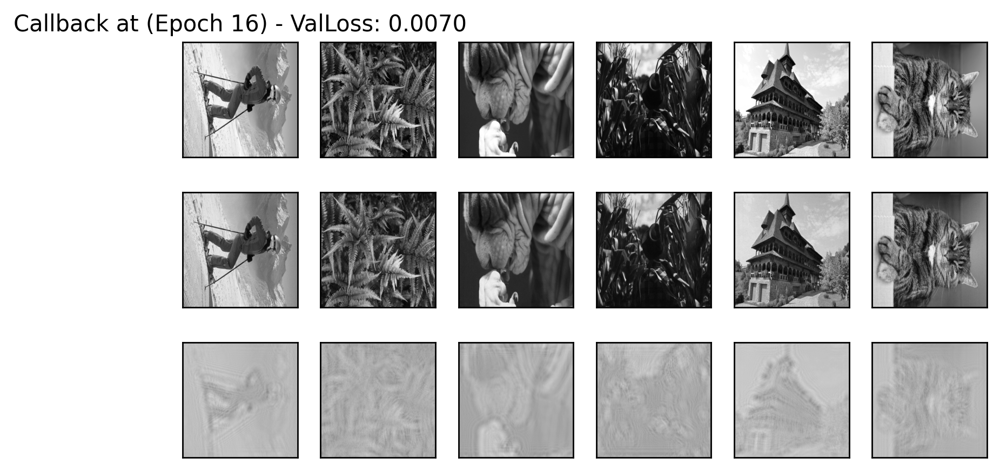

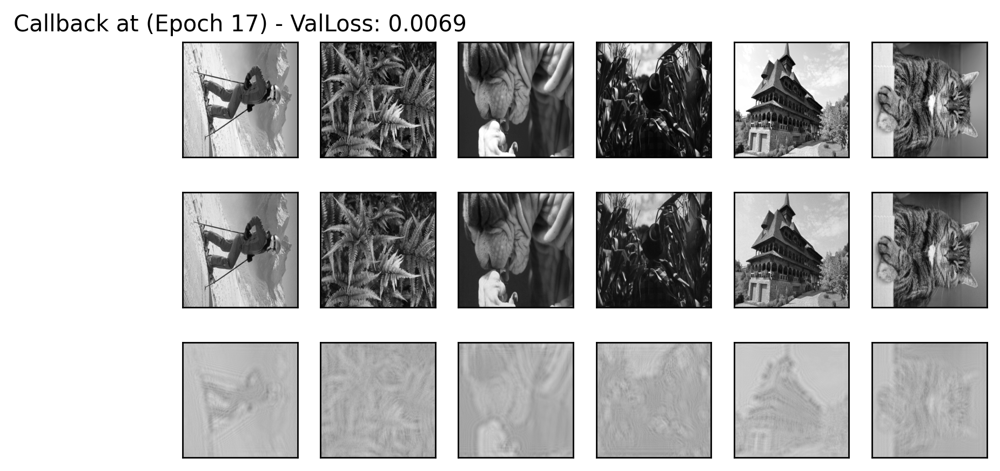

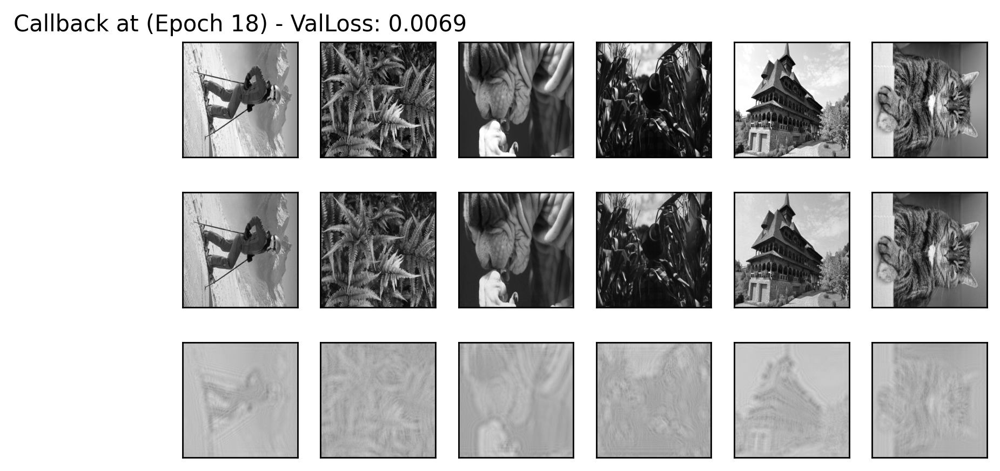

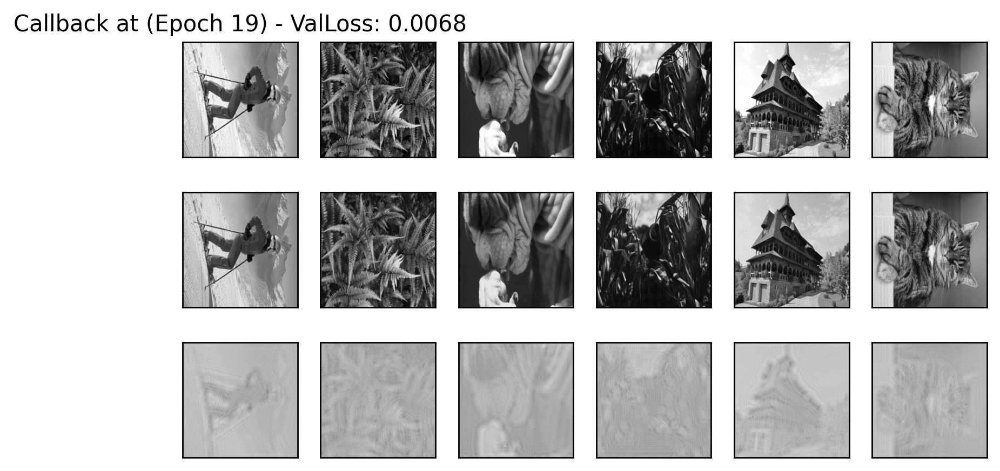

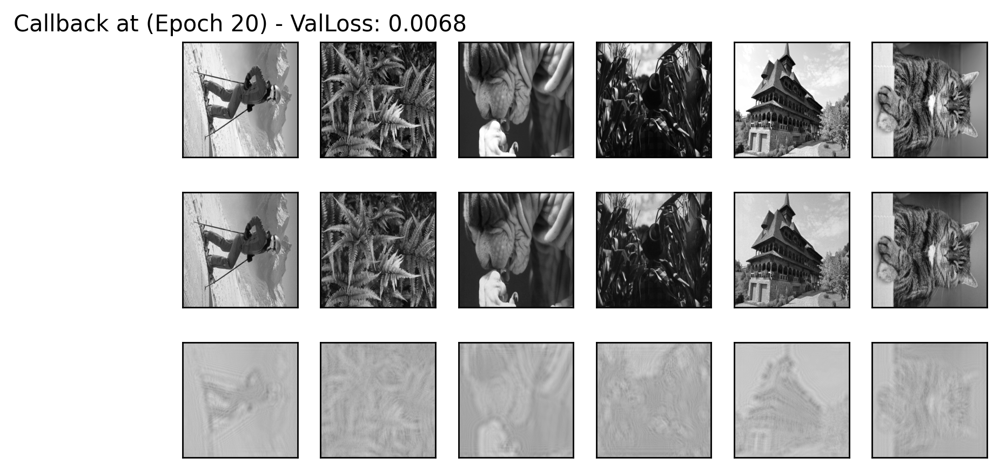

In [ ]:
load=1 #turn on here if you have pretrained weights
if load:
    #!cp  "/content/drive/MyDrive/Colab Notebooks/results/Best640/Unet_POH640_iASM_10_short2v12.h5" "./"
    model.load_weights('./Unet_POH640_10v1.h5')
    print("weight is loaded")
else:
    with strategy.scope():
        # Check if a model exists and delete it
        if 'model' in locals():
            del model#for memory save
            print('existing model deleted')
        model=create_model()

optimizer = tf.keras.optimizers.SGD(learning_rate=0.0001, momentum=0.9)#for fine-tune with small lr
#optimizer2 = tf.keras.optimizers.Lion()#latest algo

initial_epoch=15 #specify 0 or last epoch you finished(last time the model was saved)
epochs=50
learning_rate=0.00005 #default is 0.001 for Adam, 0.0001 for Lion
def lr_scheduler(epoch, lr):
    if (epoch)==initial_epoch:#small start
        return learning_rate
    elif (epoch+1)%2==0:
        return lr * 0.90  # Decay the learning rate
    else:
        return lr
lr_callback = LearningRateScheduler(lr_scheduler,verbose=1)
checkpoint = ModelCheckpoint(f'./Unet_POH{output_size[0]}_10v2.h5', monitor='val_loss', save_best_only=True, save_weights_only=True,mode='min', verbose=1)
model.compile(optimizer='adam',loss=NPCC)

model.fit(cb.train_dataset,epochs=epochs,batch_size=batch_size,callbacks=[cb,lr_callback,checkpoint],steps_per_epoch = steps_per_epoch*10 ,validation_data=[cb.test_dataset],validation_steps=validation_steps,initial_epoch=initial_epoch)

In [ ]:
#for temporal saving
!cp  "./Unet_POH640_10v2.h5" "/content/drive/MyDrive/Colab Notebooks/results/"

weight is loaded


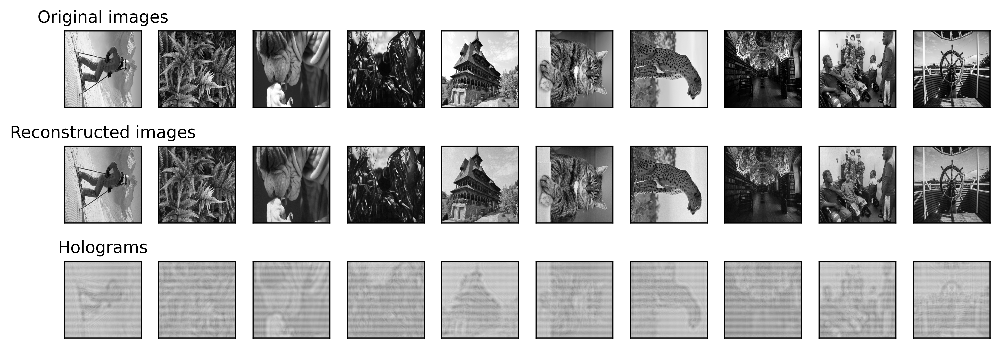

tf.Tensor(
[21.930138 27.662785 26.801188 27.545925 21.486197 23.905228 22.708008
 28.178503 23.415237 23.50728 ], shape=(10,), dtype=float32)
The max PSNR is 28.179


In [ ]:
load=1 #turn on here if you have pretrained weights
if load:
    #!cp  "/content/drive/MyDrive/Colab Notebooks/results/Best640/Unet_POH640_iASM_10_short2v13.h5" "./"
    model.load_weights('./Unet_POH640_10v2.h5')
    print("weight is loaded")

true = x_test[21:31]#load propagated ones
output=model(PropagationLayer(true,mode="input"))#predicted hologram
reconstructed=PropagationLayer(output,mode="output")#make it final output
true=tf.cast(true,dtype='float32')
output=tf.cast(output,dtype='float32')
n = 10
plt.figure(figsize=(n+2, 4), dpi=500)
plt.subplots_adjust(hspace=0.5)
for i in range(1, n + 1):
    # Display original
    ax = plt.subplot(3, n, i)
    plt.imshow(true[i-1])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    if i==1:
        ax.set_title("Original images")
    # Display reconstructed image
    ax = plt.subplot(3, n, i + n)
    plt.imshow(reconstructed[i-1])  # Reconstructed one
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    if i==1:
        ax.set_title("Reconstructed images")
    # Display hologram
    ax = plt.subplot(3, n, i + 2 * n)
    plt.imshow(output[i-1])  # Reconstructed one
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    if i==1:
        ax.set_title("Holograms")
plt.show()

psnr_values=psnr(true,reconstructed)
print(psnr_values)
Pvalue=round(tf.reduce_max(psnr_values).numpy().item(),3)
print("The max PSNR is", Pvalue)

For image saving

tf.Tensor(0.47851562, shape=(), dtype=float32)
tf.Tensor(1.0, shape=(), dtype=float32)
tf.Tensor(0.47851562, shape=(), dtype=float32)
tf.Tensor(1.0, shape=(), dtype=float32)
tf.Tensor(126, shape=(), dtype=uint8)
tf.Tensor(255, shape=(), dtype=uint8)


True

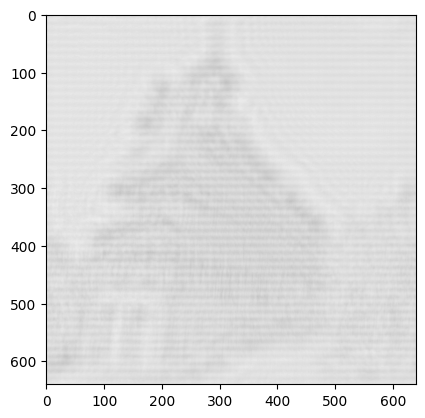

In [ ]:
#for SLM
#since model output holograms are in range of 0 to 1...

#POH=output*2*math.pi
print(K.min(output))
print(K.max(output))
#output=(output-K.min(output))/(K.max(output)-K.min(output))#normalize for each image
#output=output/K.max(output)
print(K.min(output))
print(K.max(output))
index=4
POH=tf.image.convert_image_dtype(output[index],dtype='uint8')
print(K.min(POH))
print(K.max(POH))
plt.imshow(POH,vmin=0,vmax=255)

cv2.imwrite(f'DNN_640_10cm{index+1}.png', POH.numpy())

Apparance of hologram in the plot above is not accurate, due to sampling

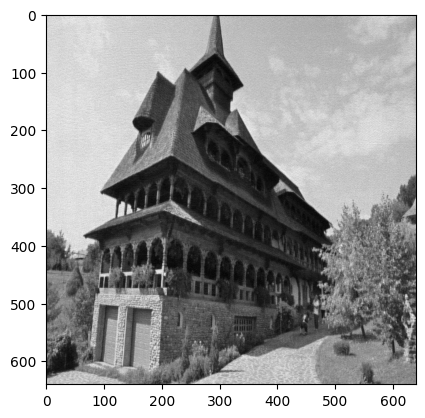

In [ ]:
#confirm POH data type conversion doesn't cause any significant errors
POHf=tf.image.convert_image_dtype(POH,dtype='float32')
POHf = tf.expand_dims(POHf, axis=0)
reconstructed2=PropagationLayer(POHf,mode="output")#make it final output
reconstructed2 = tf.squeeze(reconstructed2, axis=0)
plt.imshow(reconstructed2)

In [ ]:
#please use manually saved weight or model for ONNX(I recommend to use weight and model definition as you used in this notebook)
model.save_weights("ExportForONNX640.h5")#TPU only supports h5 way. You can use SavedModel type with GCS
!cp "./ExportForONNX640.h5" "/content/drive/MyDrive/Colab Notebooks/results/"

You need to run extra-script to work with ONNX since colab TPU cannot handle SavedModel, and ONNX doesn't support TPU yet.

In [ ]:
#TPU inference time(not used in thesis data)
import timeit
@tf.function
def inference():
    return model(PropagationLayer(true,mode="input"))#with data prep
testing_number=20 #define how many times you predict
inference_time = timeit.timeit(inference, number=testing_number)

print(f"Average inference + data prep time for each image: {inference_time / (testing_number*true.shape[0])} seconds")

Average inference + data prep time for each image: 0.004313456694999332 seconds
